<div style="text-align: center;">
    <h1 style="
        background: linear-gradient(135deg, #000d2aff, #0f1d3aff); 
        color: white; 
        padding: 15px 30px; 
        border-radius: 500px; 
        font-family: 'Segoe UI', Arial, sans-serif; 
        box-shadow: 0 4px 15px rgba(0,0,0,0.3);
        display: inline-block;
    ">
       Lab 5 Day 21/8
    </h1>
</div>


<h4 style="color:#002f94ff">1. Importing Libraries and Modules for Deep Learning, Image Processing, Callbacks, and Pretrained CNN Architectures (ResNet50, VGG16)</h4>

In [1]:
import os
import time
import shutil
import PIL
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D
from tensorflow.keras.layers import Activation, Dropout, BatchNormalization, Input, Concatenate
from tensorflow.keras.layers import GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D

from tensorflow.keras import Model,regularizers,Sequential
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam, Adamax
from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)
from IPython.display import display, HTML


Found 2000 files belonging to 2 classes.


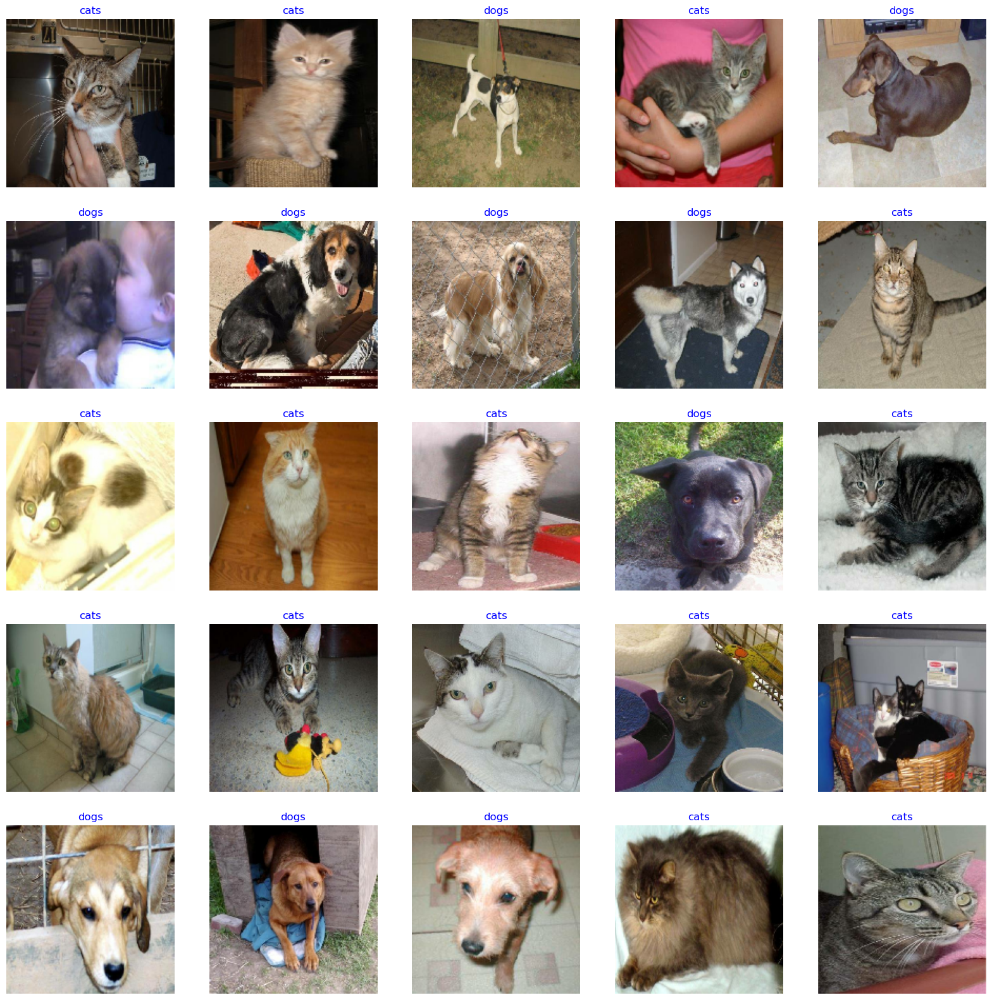

In [10]:
import pandas as pd
import os

data_dir = "C:/Users/Rammah/.keras/datasets/cats_and_dogs_filtered"

train_dir = os.path.join(data_dir, "train")
val_dir   = os.path.join(data_dir, "validation")
filepaths = []
labels = []
data_set = []

for folder_name, folder_path in [("train", train_dir), ("validation", val_dir)]:
    for label in os.listdir(folder_path):  # (cats / dogs)
        label_path = os.path.join(folder_path, label)
        for file in os.listdir(label_path):
            filepaths.append(os.path.join(folder_name, label, file))
            labels.append(label)
            data_set.append(folder_name)

df = pd.DataFrame({
    "filepaths": filepaths,
    "labels": labels,
    "data_set": data_set
})
import tensorflow as tf
import matplotlib.pyplot as plt
import os

# مسار البيانات
data_dir = r"C:\Users\Rammah\.keras\datasets\cats_and_dogs_filtered\train"

# تحميل البيانات كـ Dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    shuffle=True,
    batch_size=32,
    image_size=(160, 160)
)

# نجيب أسماء الكلاسات
class_names = train_ds.class_names
class_count = len(class_names)

# نعرض بعض الصور
plt.figure(figsize=(20,20))
for images, labels in train_ds.take(1):
    for i in range(25):
        plt.subplot(5,5,i+1)
        img = images[i] / 255.0   # للتطبيع
        plt.title(class_names[labels[i]], color='blue', fontsize=12)
        plt.imshow(img)
        plt.axis('off')
plt.show()


<h4 style="color:#002f94ff">2. Visualizing a Random Sample of Bird Images with Their Labels and Dataset Type</h4>

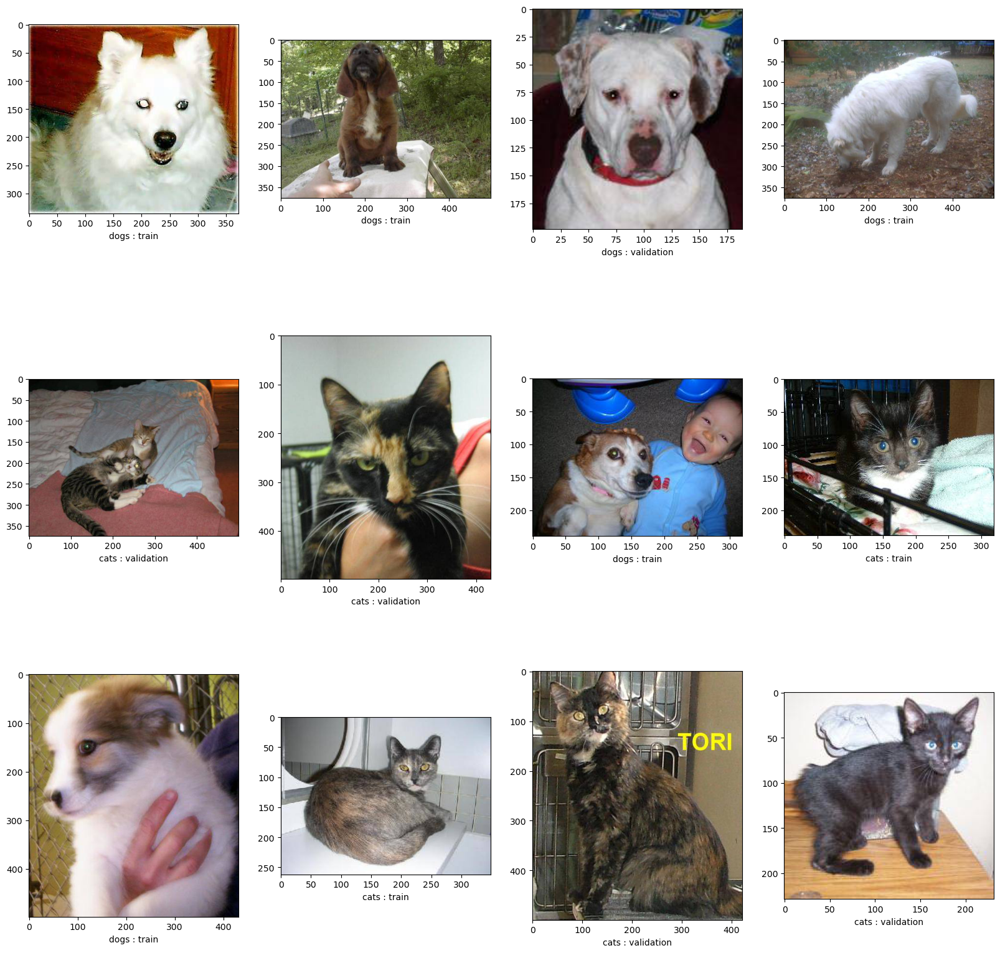

In [5]:
df = df.sample(12)
plt.figure(figsize=(20,20))
for i in range(len(df)):
    path = os.path.join(data_dir, df.iloc[i]['filepaths'])
    label = df.iloc[i]['labels']
    Type = df.iloc[i]['data_set']
    plt.subplot(3, 4, i+1)
    img = tf.keras.preprocessing.image.load_img(path)
    plt.imshow(img)
    plt.xlabel(f'{label} : {Type}')
plt.show()



<h4 style="color:#002f94ff">3. Displaying a Grid of Sample Images from the Training Dataset with Class Labels</h4>

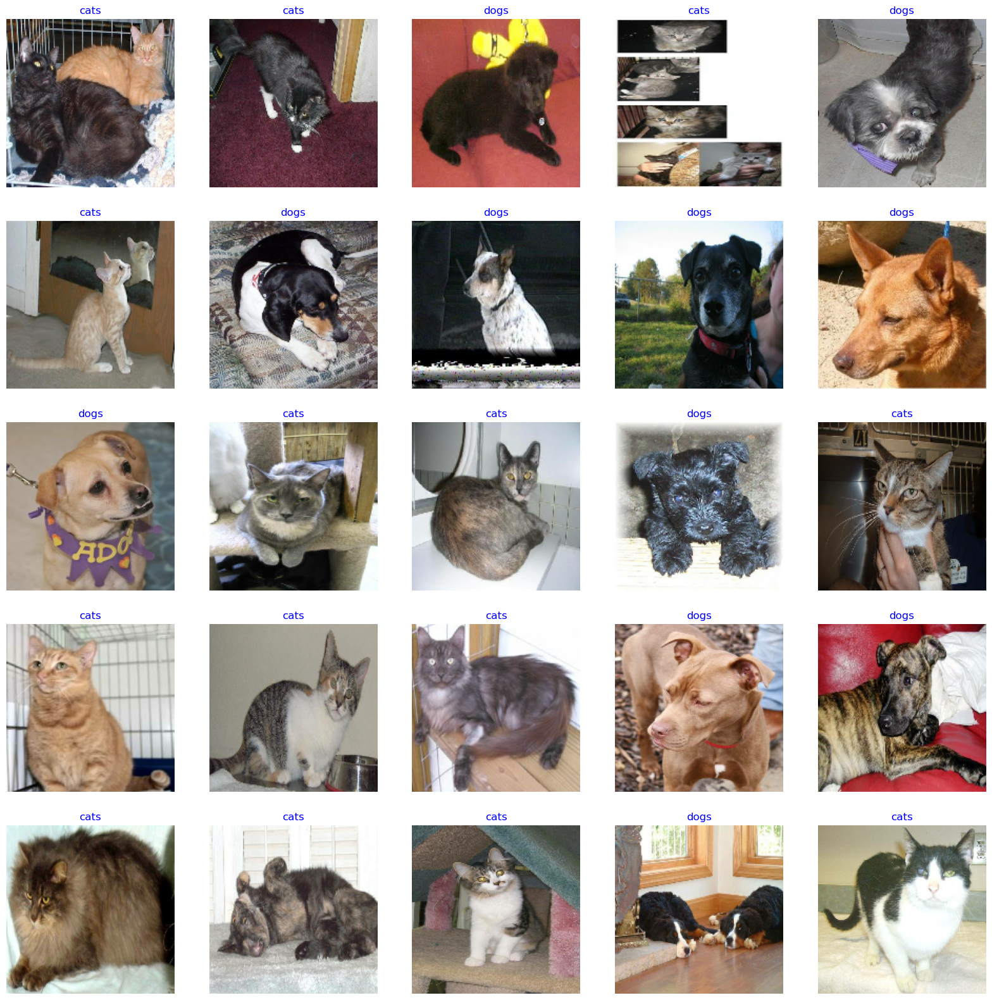

In [11]:
class_names=train_ds.class_names
class_count=len(class_names)
plt.figure(figsize=(20,20))
for images, labels in train_ds.take(1):
    for i in range (25):
        plt.subplot(5,5,i +1)
        img=images[i]/255         
        plt.title(class_names[labels[i]], color='blue', fontsize=12)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

<h4 style="color:#002f94ff">4. Creating an ImageDataGenerator with Augmentation and Flowing Training Images from Directory</h4>

In [12]:
train_data = ImageDataGenerator(preprocessing_function = preprocess_input,
                                rotation_range=20, horizontal_flip=True)

train_generator = train_data.flow_from_directory('train',
                                                batch_size=64,
                                                target_size=(224,224),
                                                class_mode='categorical')

Found 3208 images belonging to 20 classes.


<h4 style="color:#002f94ff">5. Preparing the Validation Data Generator with Preprocessing and Augmentation</h4>

In [13]:
valid_data = ImageDataGenerator(preprocessing_function = preprocess_input,
                                rotation_range=20, horizontal_flip=True)

validation_generator = valid_data.flow_from_directory('valid',
                                                batch_size=64,
                                                target_size=(224,224),
                                                class_mode='categorical')

Found 100 images belonging to 20 classes.


<h4 style="color:#002f94ff">6. Displaying Sample Augmented Images from the Training Data Generator</h4>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-121.673416..131.32].


(64, 224, 224, 3)


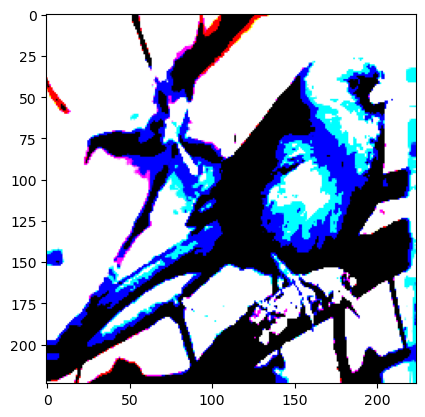

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-92.895645..140.73682].


(64, 224, 224, 3)


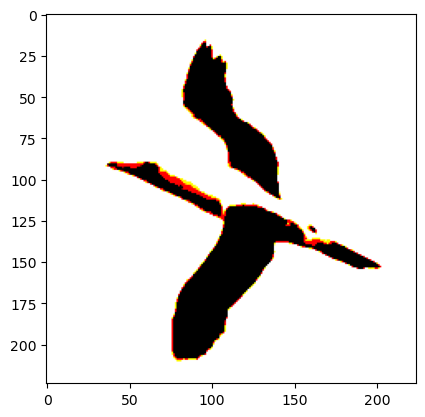

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-116.71538..136.92719].


(64, 224, 224, 3)


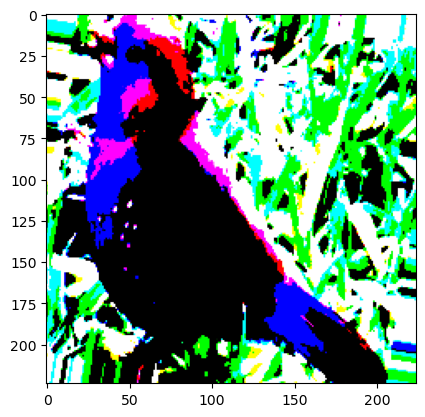

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-120.588165..149.46564].


(64, 224, 224, 3)


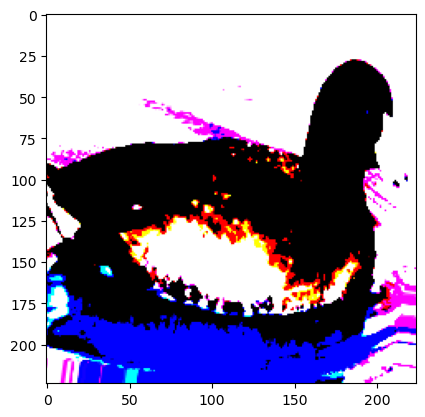

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-122.1829..151.061].


(64, 224, 224, 3)


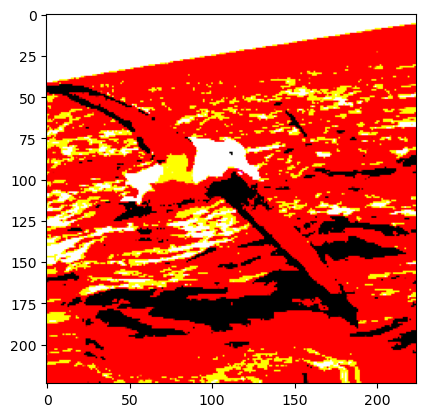

In [15]:
for _ in range(5):
    img, label = next(train_generator) 
    print(img.shape)
    plt.imshow(img[0])
    plt.show()

<h4 style="color:#002f94ff">7. Building a Transfer Learning Model Using VGG16 as Feature Extractor with Custom Fully Connected Layers for 300-Class Classification</h4>

In [16]:
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))

vgg_model.trainable = False

layer0 = Flatten(name='flatten')(vgg_model.output)
layer1 = Dense(4096, activation='relu',name='fc1')(layer0)
layer2 = Dense(4096, activation='relu',name='fc2')(layer1)
out_layer = Dense(300, activation='softmax')(layer2)
vgg_model = Model(vgg_model.input, out_layer)
vgg_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 39s 1us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 300)            │     1,229,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 135,489,644 (516.85 MB)

 Trainable params: 120,774,956 (460.72 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

<h4 style="color:#002f94ff">8. Compiling the VGG16 Transfer Learning Model with Adam Optimizer, Categorical Crossentropy Loss, and EarlyStopping Callback</h4>

In [17]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
vgg_model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=['accuracy'])
callbacks = [EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)]

<h4 style="color:#002f94ff">9. Training the VGG16 Transfer Learning Model with Training and Validation Data Using EarlyStopping</h4>

In [ ]:
history = vgg_model.fit(
      train_generator, 
      epochs=15,
      verbose=1,
      validation_data = validation_generator,
      callbacks=callbacks)

<h4 style="color:#002f94ff">10. Plotting Training and Validation Accuracy Curves for the VGG16 Transfer Learning Model</h4>

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

<h4 style="color:#002f94ff">11. Preparing the Test Data Generator with Preprocessing for Bird Species Classification</h4>

In [ ]:
test = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = test.flow_from_directory(
        '../input/100-bird-species/test',
        target_size=(224, 224),
        batch_size=64,
        class_mode='categorical')

<h4 style="color:#002f94ff">12. Evaluating the VGG16 Transfer Learning Model on the Test Dataset</h4>

In [ ]:
vgg_model.evaluate(test_generator,use_multiprocessing=True,workers=10)

<h4 style="color:#002f94ff">13. Building and Compiling an EfficientNetB3 Transfer Learning Model with Regularization, Dropout, and Dense Classifier</h4>

In [ ]:
base_model=tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max') 
x=base_model.output
base_model.trainable=False 
x=keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
                bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
x=Dropout(rate=.45, seed=123)(x)        
output=Dense(class_count, activation='softmax')(x)
model=Model(inputs=base_model.input, outputs=output)

for layer in base_model.layers:
    layer.trainable=False
    
model.compile(Adamax(lr=.001), loss='sparse_categorical_crossentropy', metrics=['accuracy']) 

<h4 style="color:#002f94ff">14.Training the EfficientNetB3 Transfer Learning Model with Validation Data and Learning Rate Reduction on Plateau</h4>

In [ ]:
epochs=10
ask_epoch=2
rlronp=tf.keras.callbacks.ReduceLROnPlateau( monitor="val_loss", factor=0.5,  patience=1, verbose=1)
history=model.fit( train_ds, validation_data=valid_ds, epochs=epochs, verbose=1, callbacks=rlronp)